# Understanding modularity

Modularity `Q` scores a partition of a graph: how many edges fall inside
communities, against how many a degree-preserving random graph would put there.
The resolution `gamma` sets the price of that null term, so the best partition
changes as `gamma` moves.

The graph here is small enough to drop the optimisation entirely and list *every*
partition of it, scoring all of them at every resolution. What is usually a
search problem becomes a surface you can look at.

The graph and the partitions live in two modules; this notebook is the tour.

- [`traag_graph.py`](src/traag_graph.py) — `TraagGraph`, the graph and its drawing.
- [`partition_landscape.py`](src/partition_landscape.py) — `PartitionLandscape`,
  the enumeration, the modularity, the ordering and the figures.

## 1. The graph

Two triangles joined through a single bridge node, `0`. It is the smallest shape
that makes the resolution parameter interesting: node `0` belongs to whichever
triangle you like, and at some `gamma` the two triangles stop being worth
merging.

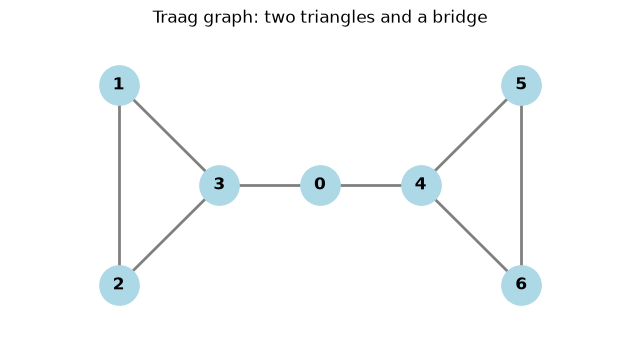

In [1]:
import matplotlib.pyplot as plt

from src.partition_landscape import PartitionLandscape
from src.traag_graph import TraagGraph

traag = TraagGraph()
traag.draw()
plt.show()

## 2. Every partition, scored

`PartitionLandscape` lists all 877 set partitions of the 7 nodes and evaluates
modularity on each one across 1000 resolutions.

`Q` is linear in `gamma`, so each partition needs only two numbers — its internal
edge fraction and its squared degree fractions — and the whole
(partition x gamma) table follows from an outer product. `verify()` checks one
entry against `networkx`.

In [2]:
landscape = PartitionLandscape(traag.graph, traag.positions, n_gammas=1000)

print(f"{landscape.n_partitions} partitions of {len(landscape.nodes)} nodes")
print(f"modularity table: {landscape.modularity.shape} (partitions x gammas)")
print(f"matches networkx: {landscape.verify()}")

877 partitions of 7 nodes
modularity table: (877, 1000) (partitions x gammas)
matches networkx: True


## 3. Ordering the partitions

Partitions have no natural order, so plotting `Q` against a partition index would
give noise. The class lays them on a line instead: neighbouring positions hold
*similar* partitions, minimising the total Mirkin distance (the number of node
pairs two partitions disagree on) along the chain.

A greedy nearest-neighbour chain is built first, then improved by swapping
positions while any swap lowers the cost. The result sits close to the floor set
by each partition's single closest neighbour.

In [3]:
for name, value in landscape.ordering_quality().items():
  print(f"{name:15s} {value:.2f}")

mean_neighbour  1.58
mean_random     7.48
mean_closest    1.16


## 4. What a partition looks like

Each community is drawn inside its own outline, and the layout pulls community
members together so the grouping is readable. Pass a `gamma` per panel to see
what that partition scores there.

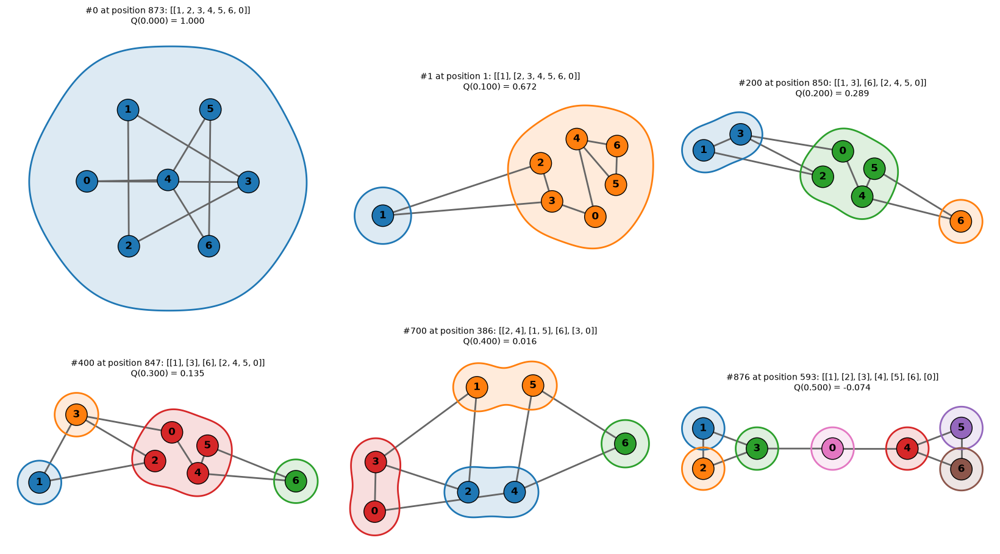

In [4]:
landscape.draw_partitions(
  [0, 1, 200, 400, 700, 876],
  gamma=[0.0, 0.1, 0.2, 0.3, 0.4, 0.5],   # one gamma per partition id above
)
plt.show()

## 5. Saving the landscape

One row per (gamma, partition) pair, with the partition, its position in the
similarity order, its communities and its modularity.

In [5]:
CSV_PATH = "modularity_traag.csv"

rows = landscape.save_csv(CSV_PATH)
print(f"wrote {CSV_PATH}: {rows} rows")

wrote modularity_traag.csv: 877000 rows


## 6. The landscape in 3D

Partition across `x`, resolution across `y`, modularity as the height. The ridge
running across the surface is the best partition, and it moves as `gamma` grows:
the peak slides from one partition to another.

In [6]:
landscape.surface_figure().show()

## 7. One resolution at a time

The same surface cut at a single `gamma`, with the slider choosing which. Red
marks the maximum — often several partitions at once, since the graph is
symmetric and node `0` can join either triangle for the same score.

Sliding `gamma` up moves the maximum from the single all-together partition,
through the two triangles, and on towards smaller and smaller communities.

In [7]:
landscape.slider_figure().show()